## Github Setup
If not already present this clones the repo into google colab so that I may work on it with a bash environment.

In [1]:
from getpass import getpass
import os

!git config --global user.name "Richard Boyne"
!git config --global user.email "boynerichard@yahoo.co.uk"

# if not in a repo clone the desired one
if not os.path.isdir(".git"):
    
    # get username and password
    user = "Boyne272"
    password = getpass('github password')
    os.environ['GITHUB_AUTH'] = user + ':' + password
    
    # clone the repo
    !git clone https://$GITHUB_AUTH@github.com/msc-acse/acse-9-independent-research-project-Boyne272.git repo

    # move the repo directory up one
    !mv repo/.git .
    
    # swap to the wanted branch
    !git checkout merging
    
    # move to previous commit
    !git reset --hard
    
# remove the sample data if there
if os.path.isdir("sample_data"):
    !rm -r sample_data/

# remove the tmp repo folder if there
if os.path.isdir("repo"):    
    !rm -r repo
    
# show where we are
!git show --summary

github password··········
Cloning into 'repo'...
remote: Enumerating objects: 191, done.
remote: Counting objects: 100% (191/191), done.
remote: Compressing objects: 100% (139/139), done.
remote: Total 191 (delta 95), reused 126 (delta 46), pack-reused 0
Receiving objects: 100% (191/191), 58.84 MiB | 23.55 MiB/s, done.
Resolving deltas: 100% (95/95), done.
D	.gitignore
D	Peliminary Report Richard Boyne.pdf
D	images/MSLIC_comparisons/MSLIC_both_1600k_10i.jpg
D	images/MSLIC_comparisons/MSLIC_polar_1600k_10i.jpg
D	images/MSLIC_comparisons/MSLIC_white_1600k_10i.jpg
D	images/MSLIC_comparisons/SLIC_polar_1600k_10i.jpg
D	images/MSLIC_comparisons/SLIC_white_1600k_10i.jpg
D	images/TX1_polarised_cropped.tif
D	images/TX1_white_cropped.tif
D	kmeans/Kmeans_Examples.ipynb
D	kmeans/MSLIC.py
D	kmeans/SLIC.py
D	kmeans/kmeans_basic.py
D	kmeans/kmeans_examples.ipynb
D	kmeans/kmeans_img.py
D	kmeans/kmeans_local.py
D	kmeans/kmeans_local_failed.py
D	kmeans/kmeans_multi_fail.py
D	kmeans/test_MSLIC.py
D	kmean

## Imports

In [0]:
# Ipython magic functions
%load_ext autoreload
%autoreload 2
%matplotlib inline

# path extensions
import sys
sys.path.insert(0, "/content/kmeans")
sys.path.insert(0, "/content/identification")
sys.path.insert(0, "/content/merging")

In [0]:
# imports
import torch
import matplotlib.pyplot as plt
import numpy as np
import scipy.signal as sig
from skimage import morphology

# custom imports
from tools import set_seed, get_img, progress_bar
from basic_heirachical_clustering import basic_heirachical_clustering
from preprocessing import preprocessing
from recombination_wrapper import recombination_wrapper
from image_filters import Image_Filters
from SLIC import SLIC
# from MSLIC import MSLIC_wrapper

## SLIC Oversegmentation

First load the image and preprocess it 

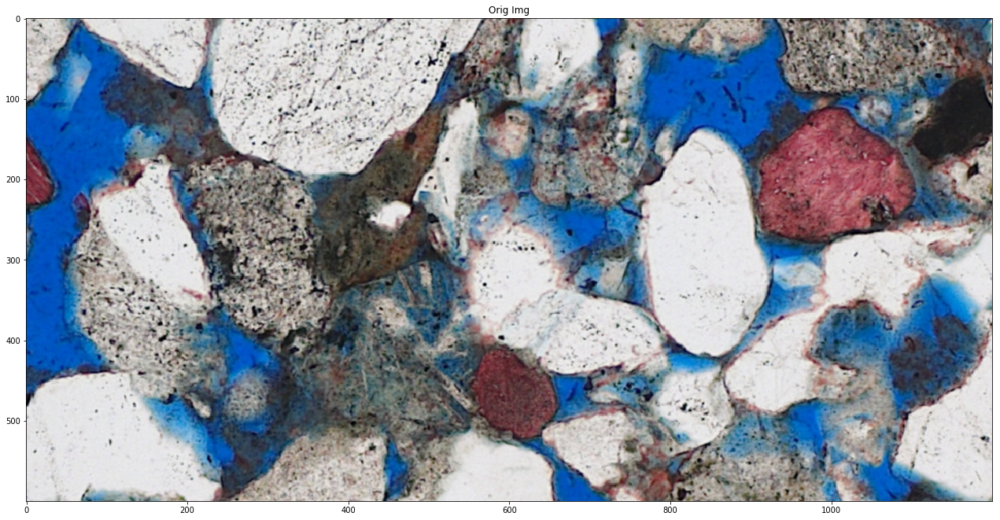

In [23]:
pre_obj = preprocessing('/content/images/TX1_white_cropped.tif')
pre_obj.show()

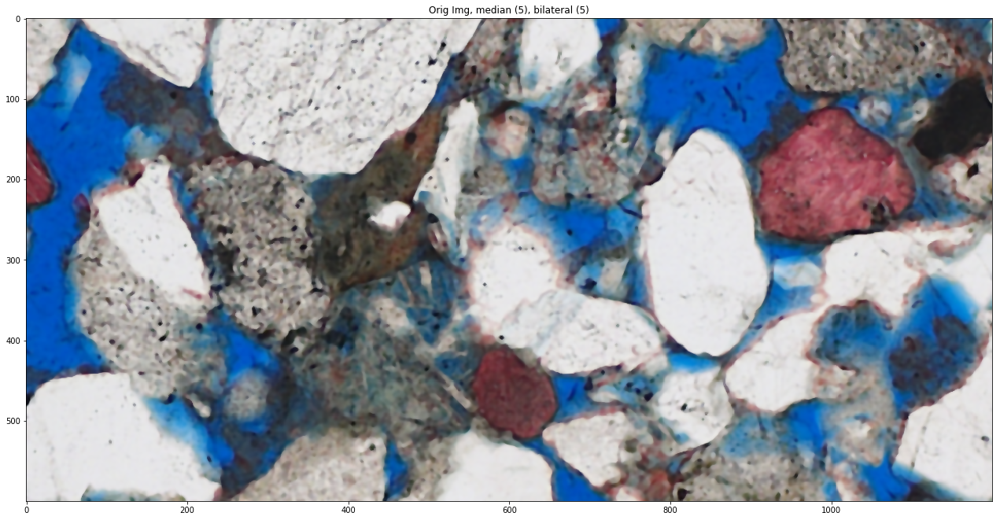

In [24]:
pre_obj.apply('median', 'bilateral')
pre_obj.show()

Apply the SLIC alogorithm

image dimensions 1200 600
grid for square 30x30 sections [40, 20]


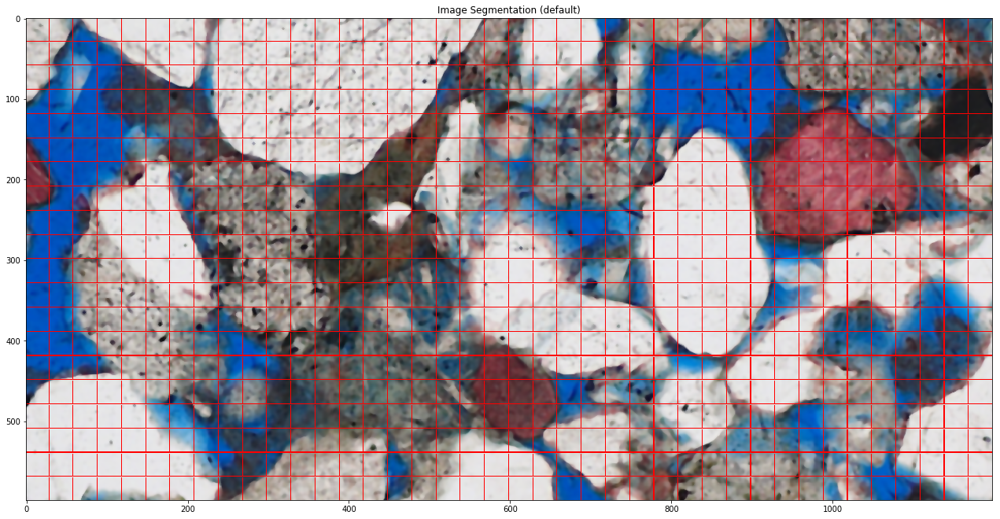

In [41]:
# define the dimensions for a 30 by 30 grid
y, x, _ = pre_obj.img.shape
print('image dimensions', x, y)
bin_grid = [int(x/30), int(y/30)]
print('grid for square 30x30 sections', bin_grid)

SLIC_obj = SLIC(pre_obj.img/255., bin_grid) ################### quick fix
SLIC_obj.plot('default')

Progress |###################################################| 59.7697 s

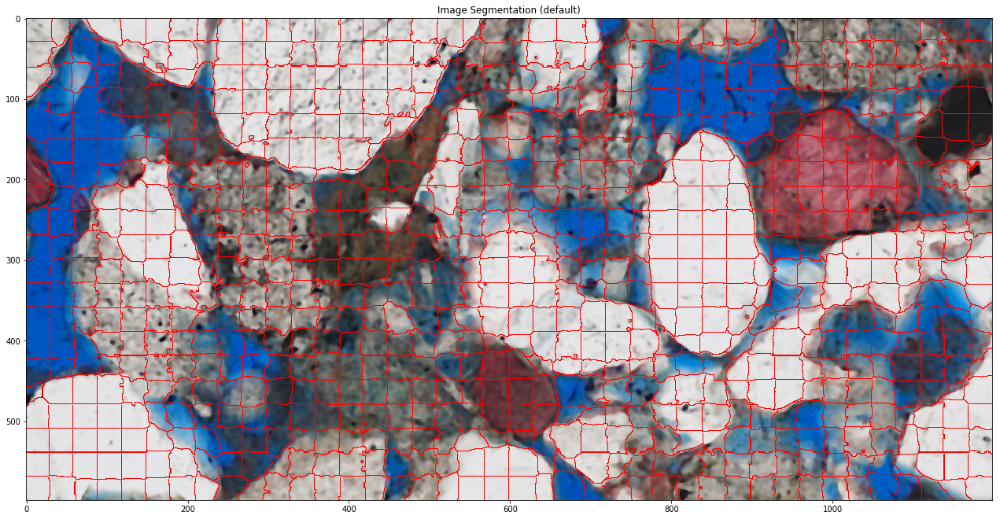

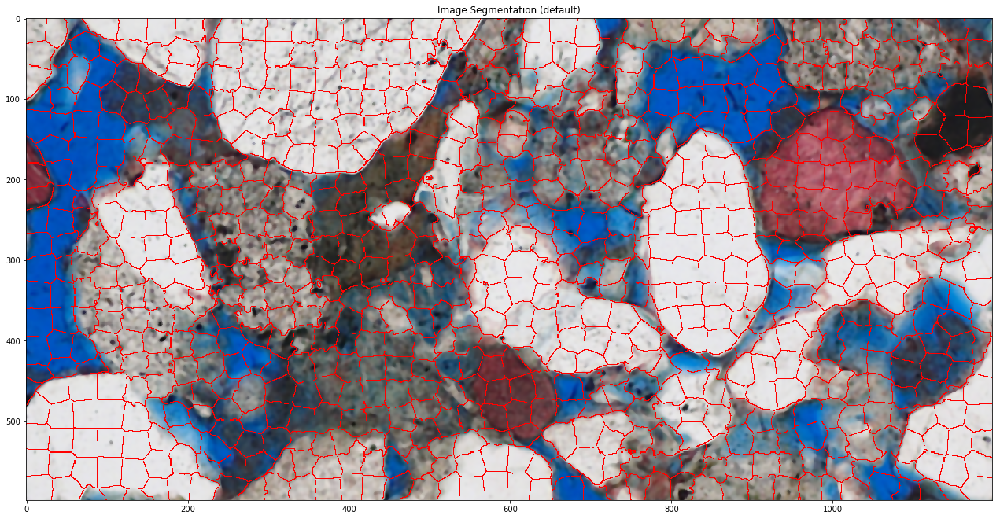

In [42]:
SLIC_obj.iterate(1)
SLIC_obj.plot('default')
SLIC_obj.iterate(9)
SLIC_obj.plot('default')

In [48]:
mask = SLIC_obj.tensor_to_mask(SLIC_obj.cluster_tensor)

# enforce connectivity
mask = morphology.label(mask, neighbors=8)
mask

array([[  0,   0,   0, ...,  40,  40,  40],
       [  0,   0,   0, ...,  40,  40,  40],
       [  0,   0,   0, ...,  40,  40,  40],
       ...,
       [874, 874, 874, ..., 887, 887, 887],
       [874, 874, 874, ..., 887, 887, 887],
       [874, 874, 874, ..., 887, 887, 887]])

## Recombintion

In [72]:
comb = recombination_wrapper(img, mask, cluster_scale=1., color_scale=1., gabor_scale=1., bound_present=-20)

# remove small segments
comb._size_scan()

Calcuating filtered images ....
Initalising 898 segments
Progress |###################################################| 15.8792 s

Clustering segments
Progress |###################################################| 0.8536 s
Number of clusters 7 

Merging 98 segments

Updating 447 segments
Progress |###################################################| 6.4639 s

Clustering segments
Progress |###################################################| 0.6527 s
Number of clusters 9 



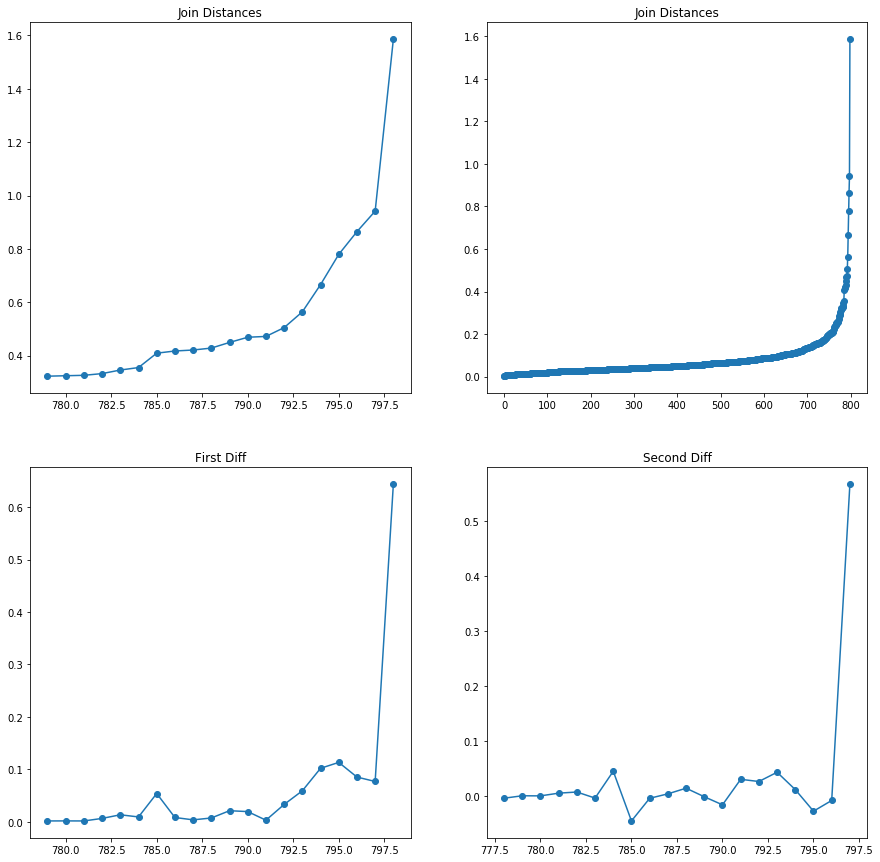

In [73]:
comb.cluster_obj.dist_plot('all')

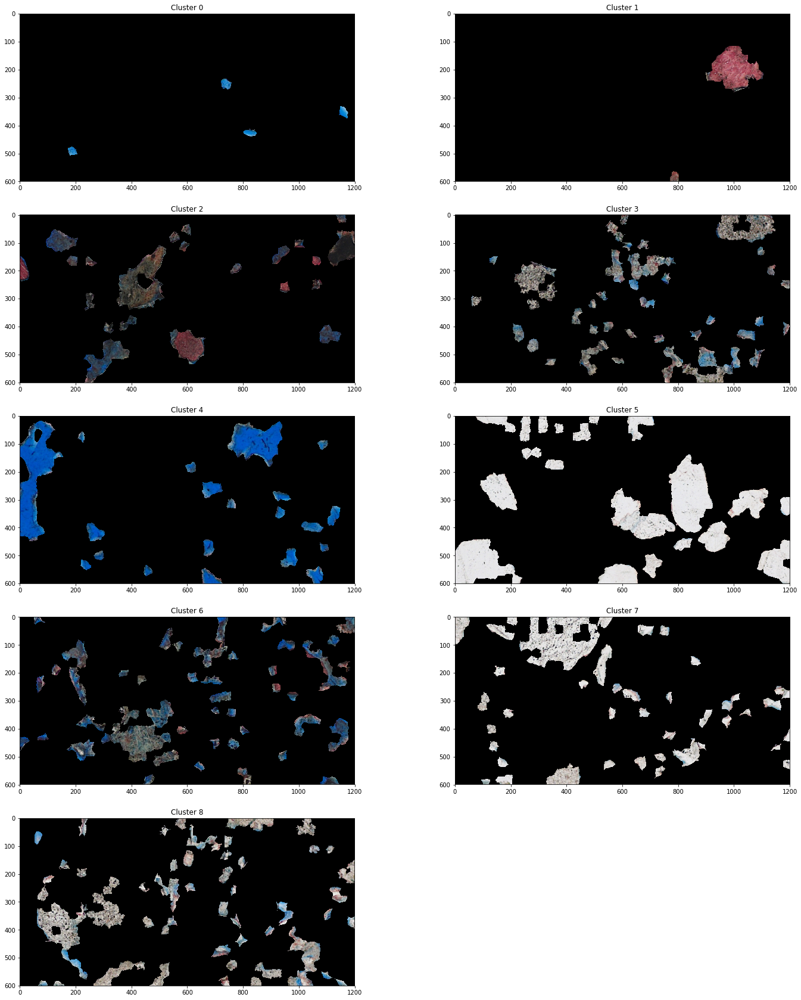

In [74]:
comb.plot('all_cluster')

Merging 988 segments

Updating 800 segments
Progress |###################################################| 6.8376 s

Clustering segments
Progress |###################################################| 0.0563 s
Number of clusters 10 



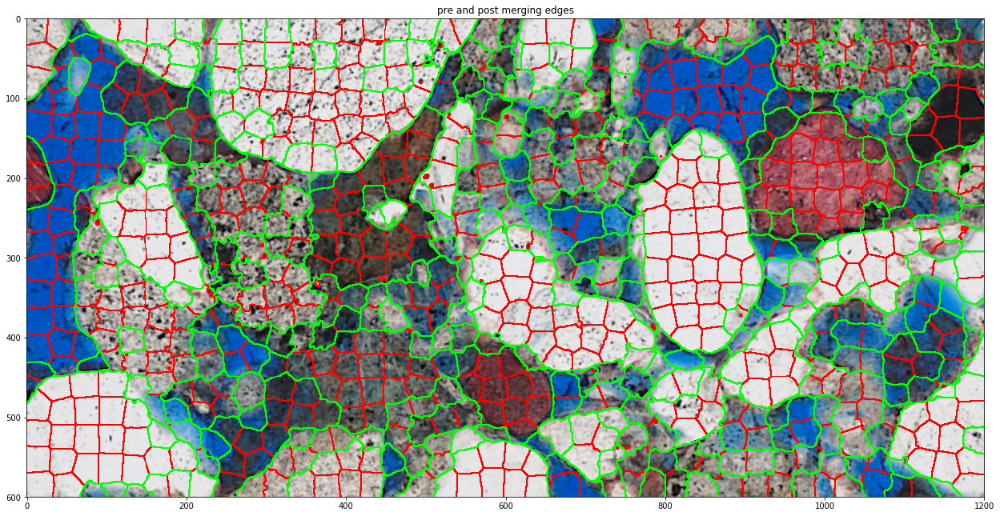

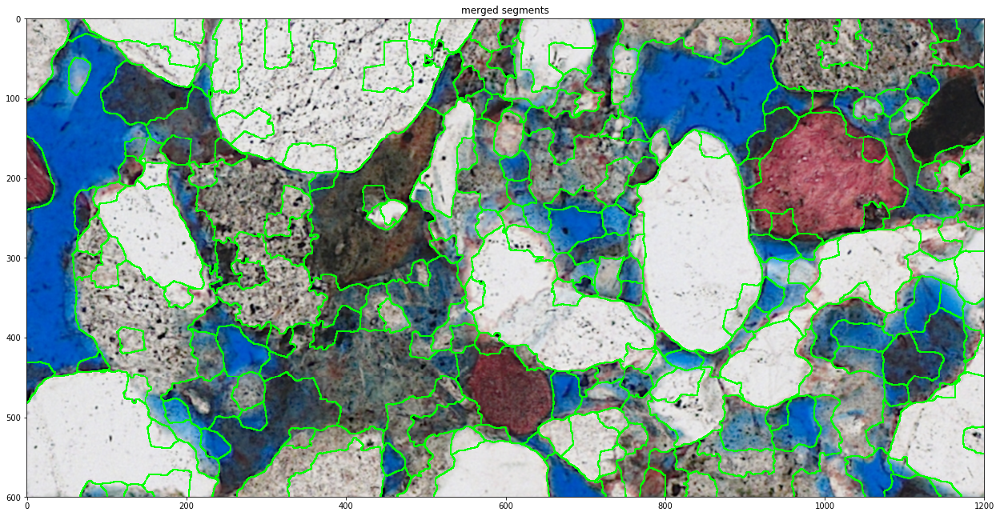

In [75]:
comb._texture_scan()
comb.plot('both')
comb.plot('merged')

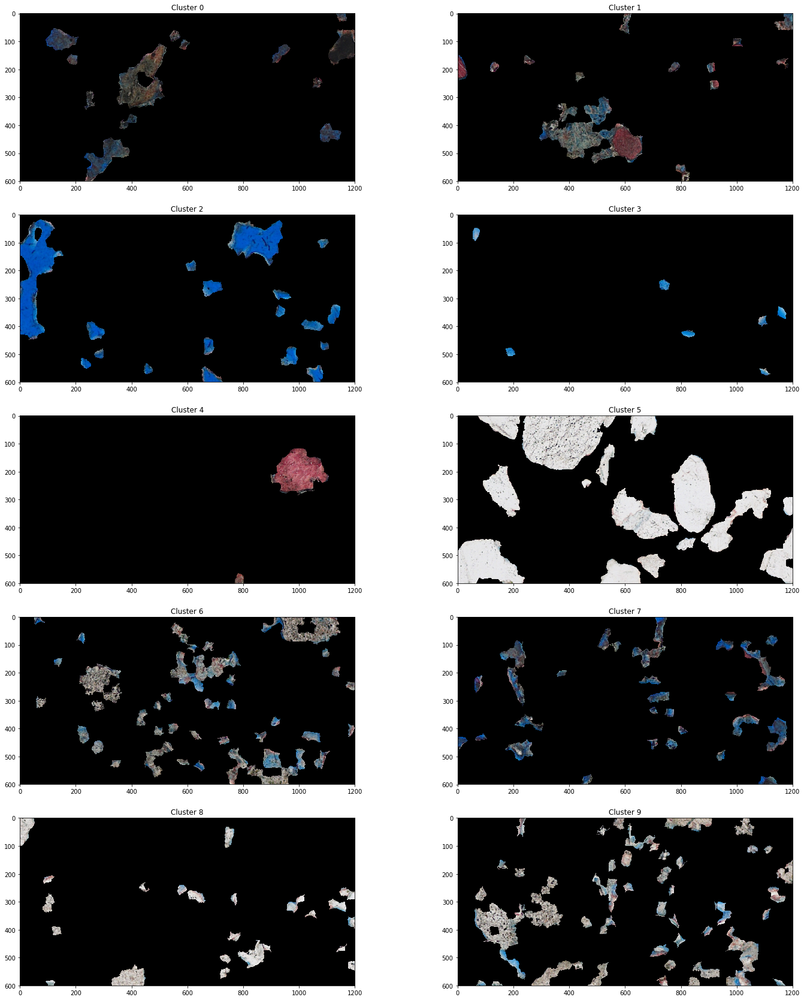

In [76]:
comb.plot('all_cluster')